In [1]:
import numpy as np
import rasterio as rio
import matplotlib.pyplot as plt
import scipy as sc

In [2]:
import gc
gc.set_threshold(1,1,1)

In [3]:
from tqdm import tqdm

maxstep = 50
def acorr(np_arrlike):
    arr = np_arrlike.astype(np.float32)
    acorrsarr = np.zeros((maxstep+1,maxstep*2+1,*arr.shape[-1:]), dtype='float32')
    arr -= np.median(arr, axis=(0,1), keepdims=True)
    for vstep in range(0,maxstep+1):
        for hstep in range(-maxstep,maxstep+1):
            a = arr
            if vstep == 0:
                a1 = a2 = a
            elif vstep > 0:
                a1 = a[vstep:]
                a2 = a[:-vstep]
            if hstep > 0:
                a1 = a1[:,hstep:]
                a2 = a2[:,:-hstep]
            elif hstep < 0:
                a1 = a1[:,:hstep]
                a2 = a2[:,-hstep:]
            acorr = np.sum(np.multiply(a1, a2), (0, 1))
            olapsz = a1.size
            acorr /= olapsz
            acorrsarr[vstep][hstep+maxstep] = acorr
    return acorrsarr

In [4]:
def acorrsarr_reduce(acorrsarr):
    Z = acorrsarr[:,maxstep:]
    diagsabsavg = np.stack([np.average(np.abs(Z[::-1,:].diagonal(i)), axis=1)
                            for i in range(-Z.shape[0]+1,Z.shape[1])])    
    Z = acorrsarr[:,:maxstep+1][:,::-1]
    diagsabsavg += np.stack([np.average(np.abs(Z[::-1,:].diagonal(i)), axis=1)
                            for i in range(-Z.shape[0]+1,Z.shape[1])])
    diagsabsavg /= 2
    return diagsabsavg

In [5]:
import os
import gc
import pickle
import itertools
from joblib import Parallel, delayed

gc.collect() 
folder_names = [
    'dec_7rad_15step_128bins_1xDownScale',
    'may_orig_7rad_15step_128bins_1xDownScale'
]
trees = {}
if os.path.exists('computed_dots'):
    with open('computed_dots','rb') as f:
        trees = pickle.load(f)
else:
    with tqdm() as pbar:
        files = []
        
        for folder_name in folder_names:
            for file in os.listdir(folder_name):
                if file.endswith(".npz"):
                    files.append((folder_name,file))
    
        def process(filetup):
            folder_name = filetup[0]
            file = filetup[1]
            treename, rest = file.split('_')
            treenum = rest.split('.')[0]
            imgpath = os.path.join(folder_name, file)
            glcms = np.nan_to_num(np.load(imgpath, allow_pickle=True))
            img = glcms[:,:,:,0]
            #crop_by_y = 0.1 * img.shape[0]
            #crop_by_x = 0.1 * img.shape[1]
            #img = img[crop_by_y:-crop_by_y,crop_by_x:-crop_by_x]
            #img = np.moveaxis(img, [2, 3], [1, 0])
            acorrs = acorr(img)
            acorrs_reduced = acorrsarr_reduce(acorrs)
            newdict = {
                'num': treenum,
                'path': imgpath,
                'folder': folder_name,
                'glcms_arr': glcms,
                'arr': img,
                'acorrsarr': acorrs,
                'reduction_v1': acorrs_reduced
            }
            #gotten = trees.get(treename, [])
            #gotten.append(newdict)
            pbar.update()
            gc.collect()
            return treename, newdict
        
        results = Parallel(n_jobs=4, backend="threading")(delayed(process)(filetup)
                                                          for filetup in files)

        for result in results:
            gotten = trees.get(result[0], [])
            gotten.append(result[1])
            trees[result[0]] = gotten

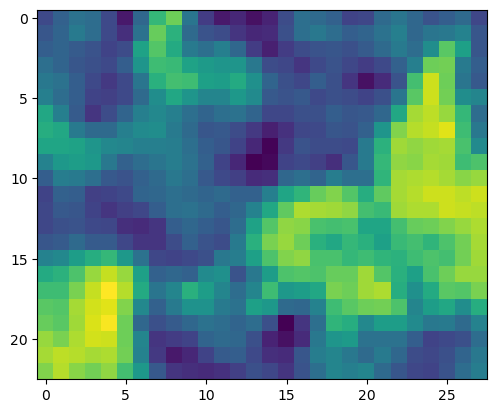

In [6]:
plt.imshow(next(iter(trees.values()))[0]['arr'][:,:,0])

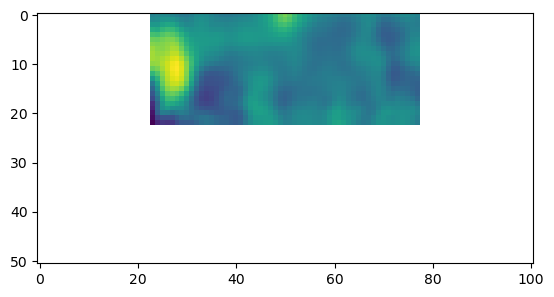

In [7]:
plt.imshow(next(iter(trees.values()))[0]['acorrsarr'][:,:,0])

In [8]:
if not os.path.exists('computed_dots'):
    with open('computed_dots','wb') as f:
        pickle.dump(trees, f, protocol=pickle.HIGHEST_PROTOCOL)

<BarContainer object of 20 artists>

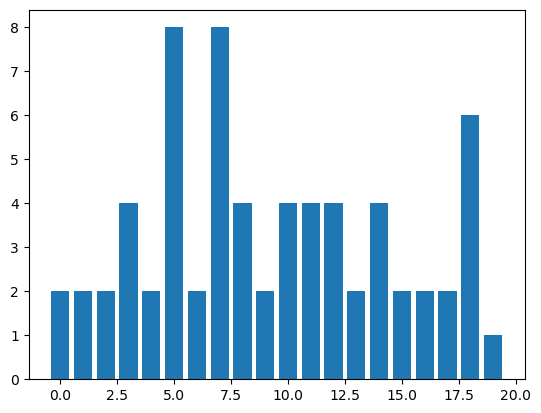

In [9]:
plt.bar(range(len(trees.values())), [len(tree) for tree in iter(trees.values())])

In [10]:
[tree[0]['path'] for tree in iter(trees.values()) if len(tree) == 1]

['may_orig_7rad_15step_128bins_1xDownScale/Cratoxylum Formosum_13.npz']

In [11]:
#trees_with_multex = [tree for tree in iter(trees.values()) if len(tree) > 1]
#[tree[0]['path'] for tree in trees_with_multex]

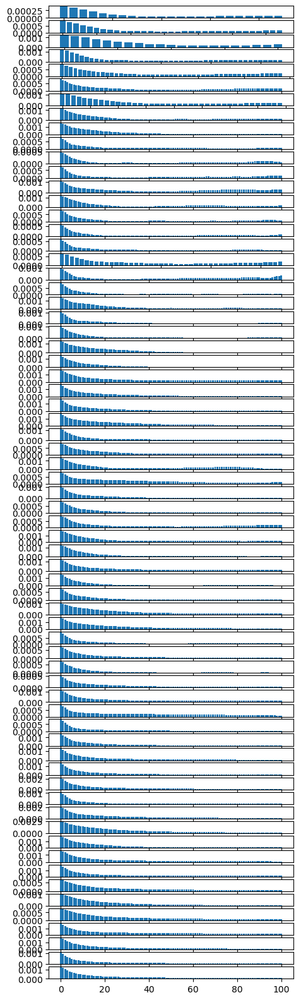

In [12]:
trees_avgs = [i['reduction_v1'] for tree in iter(trees.values()) for i in tree]
f, axes = plt.subplots(len(trees_avgs), 1, figsize=(5, 20))
for ax, tree_avg in zip(axes, trees_avgs):
    ax.bar(range(tree_avg.shape[0]), np.average(tree_avg, axis=(1)))

In [13]:
trees_avgs = [(name, i['reduction_v1'])
              for name, tree in zip(iter(trees.keys()), iter(trees.values()))
              for i in tree]

In [14]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(list(trees.keys()))

LabelEncoder()

In [15]:
trees = None
gc.collect()

53

In [16]:
import scipy.stats

def stats_of_glcms(glcms):
    gc.collect()
    glcms = glcms[:,:,:,4,:,:]
    glcms = np.moveaxis(glcms, 2, 0)
    print(glcms.shape)
    return np.moveaxis(
        np.stack(
            [np.stack((np.median(i, axis=(0,1)),
                       np.var(i, axis=(0,1))),
                      axis=1)
             for i in glcms], axis=0),
        0, -1)
    gc.collect()

In [17]:
from numpy.lib.stride_tricks import sliding_window_view as swv

def train_test_split(tr_te_or_cv):
    rlist = []
    for name, tree in zip(iter(trees.keys()), iter(trees.values())):
        for i in tree:
            if i['folder'] == folder_names[tr_te_or_cv]:
                rlist.append((le.transform([name])[0],
                              i['reduction_v1'],
                              stats_of_glcms(swv(i['glcms_arr'],
                                                 (32,32) if i['glcms_arr'].shape[0] > 32 and\
                                                            i['glcms_arr'].shape[1] > 32\
                                                 else i['glcms_arr'].shape[:2],
                                                 axis=(0,1)))))
                i['glcms_arr'] = None
                i['arr'] = None
                gc.collect()
    
    #return [(le.transform([name])[0],
    #         i['reduction_v1'],
    #         stats_of_glcms(swv(i['glcms_arr'],
    #                            (32,32) if i['glcms_arr'].shape[0] > 32 and\
    #                                       i['glcms_arr'].shape[0] > 32\
    #                                    else i['glcms_arr'].shape[:2],
    #                            axis=(0,1))))
    #        for name, tree in zip(iter(trees.keys()), iter(trees.values()))
    #        for i in tree
    #        if i['folder'] == folder_names[tr_te_or_cv]]
            #for i in (tree[1:] if tr_te_or_cv == 0 else
            #          (tree[:1] if tr_te_or_cv == 1 else tree[1:2]))
            #if len(tree) > 1]

In [18]:
#if not os.path.exists('train'):
#    train = train_test_split(0)
#    test = train_test_split(1)
#    test = [(i[0], i[1], np.moveaxis(i[2], 1, 2).reshape((-1,2,8))) for i in test]
#    train = [(i[0], i[1], np.moveaxis(i[2], 1, 2).reshape((-1,2,8))) for i in train]
#    with open('train','wb') as f:
#        pickle.dump(train, f, protocol=pickle.HIGHEST_PROTOCOL)
#    with open('test','wb') as f:
#        pickle.dump(test, f, protocol=pickle.HIGHEST_PROTOCOL)
#else:
with open('train','rb') as f:
    train = pickle.load(f)
with open('test','rb') as f:
    test = pickle.load(f)

In [19]:
[(i[0].shape, i[1].shape, i[2].shape) for i in train]

[((), (101, 8), (644, 2, 8)),
 ((), (101, 8), (1344, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (101, 8), (1024, 2, 8)),
 ((), (10

In [20]:
from numpy.lib.stride_tricks import as_strided as ast

train = np.nan_to_num(
    np.concatenate(
        [np.insert(
            np.concatenate((i[2], ast(i[1],
                                      i[2].shape[:1]+i[1].shape,
                                      (0,)+i[1].strides,
                                      writeable=False)), axis=1),
            0, i[0], axis=1)
         for i in train]))

test = np.nan_to_num(
    np.concatenate(
        [np.insert(
            np.concatenate((i[2], ast(i[1],
                                      i[2].shape[:1]+i[1].shape,
                                      (0,)+i[1].strides,
                                      writeable=False)), axis=1),
            0, i[0], axis=1)
         for i in test]))

In [21]:
(train.shape, test.shape)

((33732, 104, 8), (34816, 104, 8))

In [22]:
X_train = train[:,1:]
X_train = X_train.reshape((-1, X_train.shape[1] * X_train.shape[2]))

y_train = train[:,0,0]

X_test = test[:,1:]
X_test = X_test.reshape((-1, X_test.shape[1] * X_test.shape[2]))

y_test = test[:,0,0]

In [23]:
(train.shape, test.shape)

((33732, 104, 8), (34816, 104, 8))

In [24]:
(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

((33732, 824), (33732,), (34816, 824), (34816,))

In [25]:
#from sklearn.model_selection import train_test_split
#X_train, X_cval, y_train, y_cval =\
#    train_test_split(X_train, y_train, test_size=0.6, random_state=42)

In [26]:
#import ray
#ray.init(num_cpus=2)
#from ray import tune

In [27]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

#XGBClassifier_ = ray.put(XGBClassifier)
#accuracy_score_ = ray.put(accuracy_score)
#X_train_ = ray.put(X_train)
#y_train_ = ray.put(y_train)
#X_test_ = ray.put(X_test)
#y_test_ = ray.put(y_test)

/home/pitter/miniconda3/envs/pycrown-env-new/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [28]:
"""space = { 'max_depth': tune.randint(2, 4),
          'gamma': tune.uniform (1,9),
          'reg_alpha' : tune.randint(0,40),
          'reg_lambda' : tune.randint(1,40),
          'n_estimators': 180,
          'seed': 0 }

def objective(space):
    XGBClassifier = ray.get(XGBClassifier_)
    accuracy_score = ray.get(accuracy_score_)
    X_train = ray.get(X_train_)
    y_train = ray.get(y_train_)
    X_test = ray.get(X_test_)
    y_test = ray.get(y_test_)

    clf=XGBClassifier(
        seed=42, learning_rate=1, objective='binary:logistic',
        n_estimators = space['n_estimators'],
        max_depth = int(space['max_depth']),
        gamma = space['gamma'],
        reg_alpha = int(space['reg_alpha']),
        reg_lambda = int(space['reg_alpha']))
    print(X_test.shape)
    clf.fit(X_train, y_train, verbose=False)
    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred.astype('int'))
    print("accuracy:", accuracy)
    return {'accuracy': accuracy }"""

'space = { \'max_depth\': tune.randint(2, 4),\n          \'gamma\': tune.uniform (1,9),\n          \'reg_alpha\' : tune.randint(0,40),\n          \'reg_lambda\' : tune.randint(1,40),\n          \'n_estimators\': 180,\n          \'seed\': 0 }\n\ndef objective(space):\n    XGBClassifier = ray.get(XGBClassifier_)\n    accuracy_score = ray.get(accuracy_score_)\n    X_train = ray.get(X_train_)\n    y_train = ray.get(y_train_)\n    X_test = ray.get(X_test_)\n    y_test = ray.get(y_test_)\n\n    clf=XGBClassifier(\n        seed=42, learning_rate=1, objective=\'binary:logistic\',\n        n_estimators = space[\'n_estimators\'],\n        max_depth = int(space[\'max_depth\']),\n        gamma = space[\'gamma\'],\n        reg_alpha = int(space[\'reg_alpha\']),\n        reg_lambda = int(space[\'reg_alpha\']))\n    print(X_test.shape)\n    clf.fit(X_train, y_train, verbose=False)\n    pred = clf.predict(X_test)\n    accuracy = accuracy_score(y_test, pred.astype(\'int\'))\n    print("accuracy:", accu

In [29]:
"""
tuner = tune.Tuner(
    objective, param_space=space,
    tune_config=tune.TuneConfig(num_samples=100))
results = tuner.fit()
print(results.get_best_result(metric='accuracy', mode='max').config)
"""

"\ntuner = tune.Tuner(\n    objective, param_space=space,\n    tune_config=tune.TuneConfig(num_samples=100))\nresults = tuner.fit()\nprint(results.get_best_result(metric='accuracy', mode='max').config)\n"

In [30]:
"""bst = XGBClassifier(seed=42, n_estimators=100, max_depth=2, learning_rate=1,
                    objective='binary:logistic')
bst.fit(X_train, y_train)
preds = bst.predict(X_test)
accuracy_score(y_test, preds)"""

"bst = XGBClassifier(seed=42, n_estimators=100, max_depth=2, learning_rate=1,\n                    objective='binary:logistic')\nbst.fit(X_train, y_train)\npreds = bst.predict(X_test)\naccuracy_score(y_test, preds)"

In [31]:
#plt.hist(preds)

In [32]:
gc.collect()

1671

In [33]:
#plt.bar(range(len(bst.feature_importances_)), bst.feature_importances_)
#plt.show()

In [34]:
from sklearn.preprocessing import StandardScaler
import umap
import seaborn as sns

n_skip = 1

scaled_X = StandardScaler().fit_transform(np.concatenate((X_train, X_test)))[:,:16]
trans_y_ = np.concatenate((y_train, y_test))
trans_y_ = trans_y_.astype('int')
max_trans_y = max(trans_y_)

#reducer = umap.UMAP(n_components=3, random_state=42, init='spectral')
reducer = umap.UMAP(n_components=3, random_state=42, init='spectral')
embedding = reducer.fit_transform(scaled_X)

In [35]:
"""import matplotlib.patches as mpatches
n_skip = 2

xs = embedding[::n_skip, 0]
ys = embedding[::n_skip, 1]
zs = embedding[::n_skip, 2]
trans_y = trans_y_[::n_skip]

palette=sns.color_palette("tab20")

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(projection='3d')

ax.scatter(xs, ys, zs, s=100, c=[palette[i] for i in trans_y], marker='o')

patches = [mpatches.Patch(color=palette[i], label=le.inverse_transform([i])[0]) for i in range(max_trans_y)]
ax.legend(handles=patches)

sns.move_legend(plt.gca(), "upper left", bbox_to_anchor=(1, 1))
ax = plt.gca()
plt.title('UMAP projection of the GLCM metrics dataset', fontsize=24);"""

'import matplotlib.patches as mpatches\nn_skip = 2\n\nxs = embedding[::n_skip, 0]\nys = embedding[::n_skip, 1]\nzs = embedding[::n_skip, 2]\ntrans_y = trans_y_[::n_skip]\n\npalette=sns.color_palette("tab20")\n\nfig = plt.figure(figsize=(20,20))\nax = fig.add_subplot(projection=\'3d\')\n\nax.scatter(xs, ys, zs, s=100, c=[palette[i] for i in trans_y], marker=\'o\')\n\npatches = [mpatches.Patch(color=palette[i], label=le.inverse_transform([i])[0]) for i in range(max_trans_y)]\nax.legend(handles=patches)\n\nsns.move_legend(plt.gca(), "upper left", bbox_to_anchor=(1, 1))\nax = plt.gca()\nplt.title(\'UMAP projection of the GLCM metrics dataset\', fontsize=24);'

In [36]:
#fig.savefig('umap_v2_1.png')

In [37]:
import plotly.express as px

del reducer

n_skip = 1

trans_y = np.concatenate((y_train, y_test))
trans_y = trans_y.astype('int')
max_trans_y = max(trans_y)
trans_y = trans_y

palette=sns.color_palette("tab20")

xs = embedding[:, 0]
ys = embedding[:, 1]
zs = embedding[:, 2]

fig = px.scatter_3d(x=xs, y=ys, z=zs, size_max=1, color=le.inverse_transform(trans_y))
fig.update_traces(marker_size=2)
fig.show()

In [38]:
fig.write_html("plotly_glcmstats.html")
del fig
del ax